## Find the divergence

In [1]:
from datetime import timedelta
import numpy as np
from glob import glob
import xarray as xr
import matplotlib.pyplot as plt
import cmocean as cm

In [2]:
path1= '/gxfs_work/geomar/smomw662/FESOM_data/channel_interp'

ds_u = xr.open_dataset(f"{path1}/u.1960.nc")
ds_v = xr.open_dataset(f"{path1}/v.1960.nc")
ds_w = xr.open_dataset(f"{path1}/w.1960.nc")
# ufiles = sorted(glob(f"{path1}/u.1960.nc"))
# vfiles = sorted(glob(f"{path1}/v.1960.nc"))
# wfiles = sorted(glob(f"{path1}/w.1960.nc"))

In [4]:
ds_w

<xarray.Dataset> Size: 5GB
Dimensions:   (z: 42, time: 365, grid_lat: 584, grid_lon: 144)
Coordinates:
    nz        (z) float64 336B ...
  * time      (time) datetime64[ns] 3kB 1960-01-01T23:50:00 ... 1960-12-30T23...
    lon       (grid_lat, grid_lon) float64 673kB ...
    lat       (grid_lat, grid_lon) float64 673kB ...
    nod2      (grid_lat, grid_lon) int64 673kB ...
  * grid_lon  (grid_lon) float64 1kB 0.0 0.03147 0.06294 ... 4.437 4.469 4.5
  * grid_lat  (grid_lat) float64 5kB 0.0 0.03087 0.06175 ... 17.94 17.97 18.0
  * z         (z) float64 336B 0.0 4.519 14.01 ... 3.459e+03 3.814e+03 4e+03
Data variables:
    w         (time, z, grid_lat, grid_lon) float32 5GB ...

### Divergence in 2D

In [3]:
## Divergence for the interpolated FESOM in 2D
u_sel=ds_u.u.sel(time=slice('1960-01-01'),z=slice(1))
v_sel=ds_v.v.sel(time=slice('1960-01-01'),z=slice(1))
w_sel=ds_w.w.sel(time=slice('1960-01-01'),z=slice(1))

In [4]:
w_sel

<xarray.DataArray 'w' (time: 1, z: 1, grid_lat: 584, grid_lon: 144)> Size: 336kB
[84096 values with dtype=float32]
Coordinates:
    nz        (z) float64 8B ...
  * time      (time) datetime64[ns] 8B 1960-01-01T23:50:00
    lon       (grid_lat, grid_lon) float64 673kB ...
    lat       (grid_lat, grid_lon) float64 673kB ...
    nod2      (grid_lat, grid_lon) int64 673kB ...
  * grid_lon  (grid_lon) float64 1kB 0.0 0.03147 0.06294 ... 4.437 4.469 4.5
  * grid_lat  (grid_lat) float64 5kB 0.0 0.03087 0.06175 ... 17.94 17.97 18.0
  * z         (z) float64 8B 0.0
Attributes:
    description:  vertical velocity
    long_name:    vertical velocity
    units:        m/s
    location:     node
    mesh:         fesom_mesh

In [5]:
U=u_sel.drop(['nz','elem','elem_center_lons','elem_center_lats','target_lat','target_lon','z'])
V=v_sel.drop(['nz','elem','elem_center_lons','elem_center_lats','target_lat','target_lon','z'])
W=w_sel.drop(['nz','nod2','lon','lat','z'])

/tmp/ipykernel_3934962/3570859912.py:1: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  U=u_sel.drop(['nz','elem','elem_center_lons','elem_center_lats','target_lat','target_lon','z'])
/tmp/ipykernel_3934962/3570859912.py:2: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  V=v_sel.drop(['nz','elem','elem_center_lons','elem_center_lats','target_lat','target_lon','z'])
/tmp/ipykernel_3934962/3570859912.py:3: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  W=w_sel.drop(['nz','nod2','lon','lat','z'])


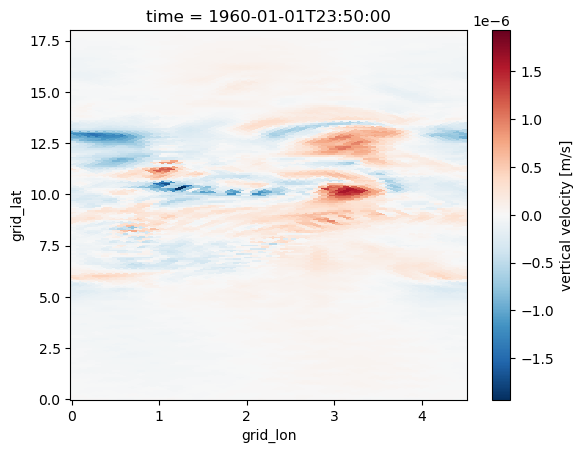

In [6]:
W.plot()

In [7]:
dudx = U.differentiate('grid_lon')
dvdy = V.differentiate('grid_lat')

divergence_2D = dudx + dvdy

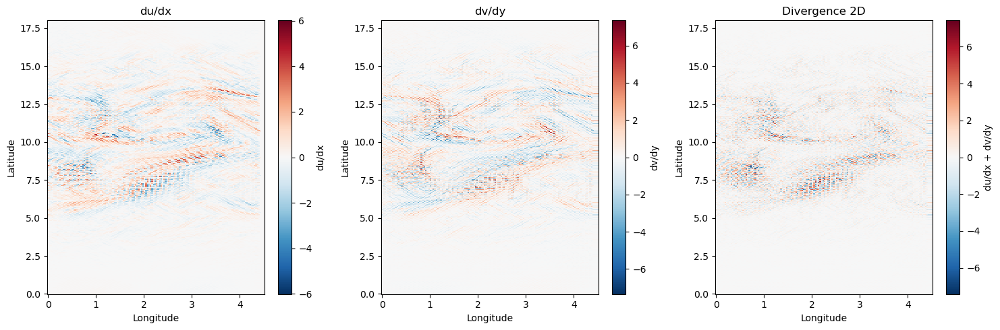

In [8]:
fig,axs = plt.subplots(1,3,figsize=(15,5))

dudx.plot(ax=axs[0], cbar_kwargs={"label":"du/dx"}) 
axs[0].set_title("du/dx")
axs[0].set_xlabel("Longitude")
axs[0].set_ylabel("Latitude")

dvdy.plot(ax=axs[1], cbar_kwargs={"label":"dv/dy"})
axs[1].set_title("dv/dy")
axs[1].set_xlabel("Longitude")
axs[1].set_ylabel("Latitude")

divergence_2D.plot(ax=axs[2], cbar_kwargs={"label":"du/dx + dv/dy"})
axs[2].set_title("Divergence 2D")
axs[2].set_xlabel("Longitude")
axs[2].set_ylabel("Latitude")

plt.tight_layout()
# plt.savefig("Divergence_2D.png", dpi=300, bbox_inches="tight")  # Save the figure

plt.show()

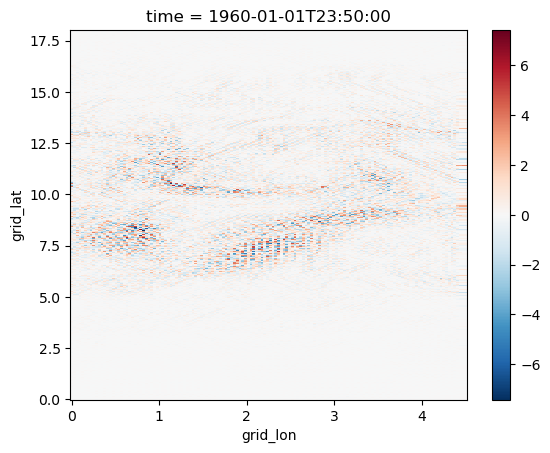

In [9]:
divergence_2D.plot()

### Divergence 3D

In [5]:
## Divergence for the interpolated FESOM in 2D
# u_sel=ds_u.u.sel(time=slice('1960-01-01'))
# v_sel=ds_v.v.sel(time=slice('1960-01-01'))
# w_sel=ds_w.w.sel(time=slice('1960-01-01'))

u_sel=ds_u.u
v_sel=ds_v.v
w_sel=ds_w.w

In [6]:
U_3d = u_sel.drop(['nz','elem','elem_center_lons','elem_center_lats','target_lat','target_lon'])
V_3d = v_sel.drop(['nz','elem','elem_center_lons','elem_center_lats','target_lat','target_lon'])
W_3d = w_sel.drop(['nz','nod2','lon','lat'])

/tmp/ipykernel_2217146/443691518.py:1: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  U_3d = u_sel.drop(['nz','elem','elem_center_lons','elem_center_lats','target_lat','target_lon'])
/tmp/ipykernel_2217146/443691518.py:2: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  V_3d = v_sel.drop(['nz','elem','elem_center_lons','elem_center_lats','target_lat','target_lon'])
/tmp/ipykernel_2217146/443691518.py:3: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  W_3d = w_sel.drop(['nz','nod2','lon','lat'])


#### Divergence 1st try

In [5]:
dudx_3d = U_3d.differentiate('grid_lon')
dvdy_3d = V_3d.differentiate('grid_lat')
dwdz_3d = W_3d.differentiate('z')

In [6]:
divergence_3D = dudx_3d + dvdy_3d + dwdz_3d

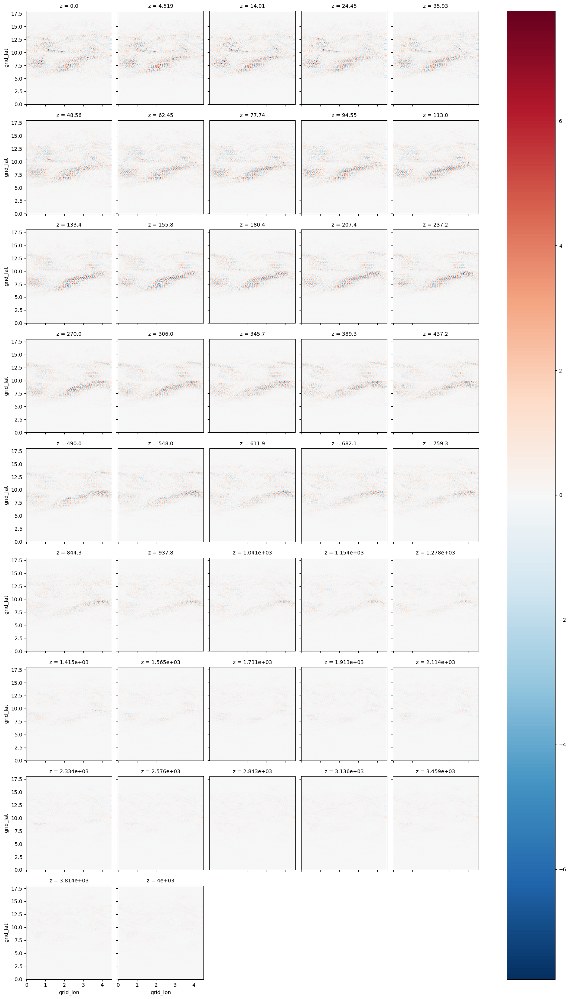

In [7]:
divergence_3D.plot(x="grid_lon", y="grid_lat", col="z", col_wrap=5)

#### First try

In [49]:
## integrate to find the induced noise ##dw"/dz = -a --> dw" = integral(-a)dz
## for the first layer
divergence_sel = divergence_3D.sel(z=slice(0,5))

#compute the negative divergece
neg_a = -divergence_sel

#Integrate -a along the 'z' axis using the trapezoidal rule
w_noise = neg_a.cumsum(dim='z') * np.abs(neg_a.z.diff('z').mean())

w_noise.name = "w_noise"

In [50]:
w_noise

<xarray.DataArray 'w_noise' (time: 1, z: 2, grid_lat: 584, grid_lon: 144)> Size: 1MB
array([[[[ 1.99423060e-01, -6.00374300e-07, -1.89348747e-01, ...,
          -4.20185118e-02, -4.02042670e-07, -4.02042670e-07],
         [-2.91769639e-02,  3.52671264e-02,  8.06712430e-02, ...,
          -4.02042670e-07, -3.06818147e-08, -3.06818147e-08],
         [ 8.90396096e-03, -4.32649104e-02,  2.95292965e-02, ...,
          -1.34612591e-03, -1.34612591e-03, -1.34612591e-03],
         ...,
         [-8.70345529e-07, -8.70345529e-07,  3.86166787e-01, ...,
          -1.13028509e-01, -6.28867839e-07, -6.28867839e-07],
         [-8.70345529e-07, -8.70345529e-07,  3.86166787e-01, ...,
          -1.13028509e-01, -1.13028509e-01, -6.28867839e-07],
         [-8.70345529e-07, -8.70345529e-07,  3.86166787e-01, ...,
          -6.28867839e-07, -3.28969423e-01,  2.05825316e-01]],

        [[ 3.98846323e-01, -1.00707953e-06, -3.78697528e-01, ...,
          -8.40368974e-02, -6.74394210e-07, -6.74394210e-07],
         [-5.83537343e-02,  7.05344464e-02,  1.61342469e-01, ...,
          -6.74394210e-07, -5.14662712e-08, -5.14662712e-08],
         [ 1.78078735e-02, -8.65298713e-02,  5.90585424e-02, ...,
          -2.69224209e-03, -2.69224209e-03, -2.69224209e-03],
         ...,
         [-1.45993449e-06, -1.45993449e-06,  7.72333036e-01, ...,
          -2.26056816e-01, -1.05487518e-06, -1.05487518e-06],
         [-1.45993449e-06, -1.45993449e-06,  7.72333036e-01, ...,
          -2.26056816e-01, -2.26056816e-01, -1.05487518e-06],
         [-1.45993449e-06, -1.45993449e-06,  7.72333036e-01, ...,
          -1.05487518e-06, -6.57938645e-01,  4.11650834e-01]]]])
Coordinates:
  * time      (time) datetime64[ns] 8B 1960-01-01T23:50:00
  * grid_lon  (grid_lon) float64 1kB 0.0 0.03147 0.06294 ... 4.437 4.469 4.5
  * grid_lat  (grid_lat) float64 5kB 0.0 0.03087 0.06175 ... 17.94 17.97 18.0
  * z         (z) float64 16B 0.0 4.519

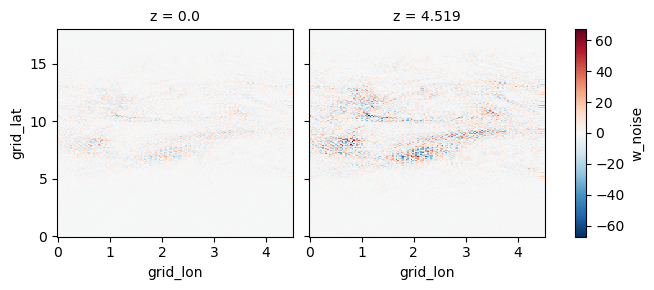

In [10]:
w_noise.plot(x="grid_lon", y="grid_lat", col="z", col_wrap = 2)

#### Second try

In [7]:
## Compute the divergence 
dx = U_3d.grid_lon.diff(dim='grid_lon')
dy = V_3d.grid_lat.diff(dim='grid_lat')
dz = W_3d.grid_lat.diff(dim='z')

In [8]:
# Grid spacing (assuming uniform)
# dx = dy = dz = 1.0
def compute_divergence_xarray(u, v, w, dx, dy, dz):
    # Central difference scheme for interior points using xarray.roll
    du_dx = (u.roll(grid_lon=-1, roll_coords=False) - u.roll(grid_lon=1, roll_coords=False)) / (2 * dx)
    dv_dy = (v.roll(grid_lat=-1, roll_coords=False) - v.roll(grid_lat=1, roll_coords=False)) / (2 * dy)
    dw_dz = (w.roll(z=-1, roll_coords=False) - w.roll(z=1, roll_coords=False)) / (2 * dz)
    
    # Sum of derivatives to compute divergence
    divergence = du_dx + dv_dy + dw_dz
    return divergence


In [ ]:
div = compute_divergence_xarray(U_3d, V_3d, W_3d, dx, dy, dz)

In [ ]:
div.sel(time=slice('1960-02-01')).plot(x="grid_lon", y="grid_lat", col="z", col_wrap=5)

#### This one worked :)

In [23]:
## Let's try again 
neg_A = -div

# w_k = neg_A * div.z.diff(dim='z')
# div.z.diff(dim='z')

z_k = np.insert(div.z.diff(dim='z'), 0, 0)

z_k_expanded = xr.DataArray(
    z_k,
    dims=["z"],  # Keep the existing z dimension
    coords={"z": neg_A.z},  # Align with neg_A's z coordinates
)

# Broadcast z_k_expanded across the other dimensions of neg_A
z_k_broad = z_k_expanded.broadcast_like(neg_A)

## get the W_k
w_k = neg_A * z_k_broad

/opt/conda/lib/python3.11/site-packages/xarray/core/computation.py:831: RuntimeWarning: invalid value encountered in log10
  result_data = func(*input_data)


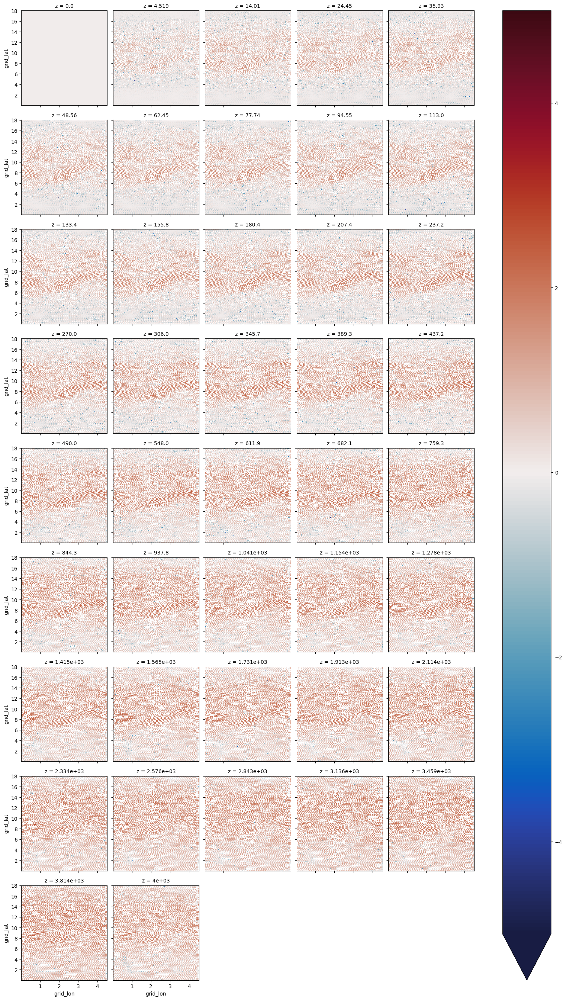

In [14]:
w_k_log = np.log10(w_k+1)
w_k_log.plot(x="grid_lon", y="grid_lat", col="z", col_wrap=5, vmin=-5,vmax=5,cmap=cm.cm.balance)

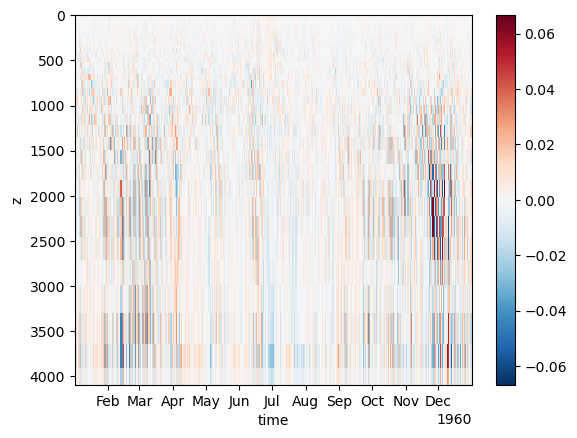

In [25]:
w_k.mean(dim=("grid_lat","grid_lon")).plot(y="z")
plt.gca().invert_yaxis()  # Invert the y-axis (z-axis in this case)
plt.show()

### Diferent approaches

In [79]:
#%---------------------- Cumulative Error--------------------%#
# Compute -A (negative divergence)
neg_A = -div

# Perform cumulative integration along the 'z' dimension to get w''
# Use the trapezoidal rule for integration
w_prime = xr.apply_ufunc(
    np.cumsum,
    neg_A,
    input_core_dims=[["z"]],
    output_core_dims=[["z"]],
    kwargs={"axis": 0},  # Integrate along the 'z' axis
    dask="allowed"
)
w_prime ## contains the cumulative sum of the neg_A in all depths.

<xarray.DataArray (time: 1, grid_lat: 583, grid_lon: 143, z: 42)> Size: 28MB
array([[[[ 7.79501739e-03,  7.79489269e-03,  7.73430031e-03, ...,
           1.37526343e-02,  1.42381731e-02,  1.42382978e-02],
         [ 1.78532171e-02,  1.78531846e-02,  1.78433361e-02, ...,
           1.50605167e-02,  1.51910083e-02,  1.51910408e-02],
         [-1.10980696e-02, -1.10981021e-02, -1.10488143e-02, ...,
          -2.59448838e-03, -2.44200828e-03, -2.44197582e-03],
         ...,
         [-6.47471703e-06, -6.51085727e-06, -7.23733916e-06, ...,
          -1.56691472e-04,  3.63538272e-05,  3.63899679e-05],
         [-5.33291572e-07, -4.96874939e-07, -5.47240974e-07, ...,
          -6.63793169e-05, -6.88661946e-05, -6.89026114e-05],
         [-2.29262252e-02, -2.29261888e-02, -2.29192546e-02, ...,
          -2.46169749e-02, -2.55194568e-02, -2.55194932e-02]],

        [[-9.57316744e-03, -9.57316696e-03, -9.63051388e-03, ...,
          -1.04360075e-02, -1.04416818e-02, -1.04416823e-02],
         [ 6.53591411e-03,  6.53591460e-03,  6.58447525e-03, ...,
           2.32317962e-03,  2.50758884e-03,  2.50758835e-03],
         [ 2.94631637e-03,  2.94631905e-03,  2.93083863e-03, ...,
           6.77147247e-04,  1.06931420e-03,  1.06931152e-03],
...
         [-2.50126621e-02, -2.50126617e-02, -2.43476533e-02, ...,
          -2.45833020e-02, -2.59494860e-02, -2.59494864e-02],
         [-2.50126621e-02, -2.50126617e-02, -2.43476533e-02, ...,
          -2.45833020e-02, -2.59494860e-02, -2.59494864e-02],
         [ 7.61428846e-02,  7.61428850e-02,  7.84596019e-02, ...,
           9.23454027e-02,  9.51083514e-02,  9.51083510e-02]],

        [[-4.32068366e-03, -4.32068348e-03, -3.97911774e-03, ...,
          -2.09508497e-03,  2.49961389e-03,  2.49961371e-03],
         [ 8.11362943e-02,  8.11362943e-02,  8.08741315e-02, ...,
           6.39779051e-02,  6.90148082e-02,  6.90148081e-02],
         [ 1.19770818e-01,  1.19770818e-01,  1.18301762e-01, ...,
           5.84640342e-02,  5.68822057e-02,  5.68822056e-02],
         ...,
         [ 7.62057071e-03,  7.62057111e-03,  6.50266928e-03, ...,
           1.87853044e-02,  2.41643532e-02,  2.41643528e-02],
         [-1.73920716e-02, -1.73920712e-02, -1.78449669e-02, ...,
          -5.79852436e-03, -1.78594044e-03, -1.78594084e-03],
         [ 5.87508309e-02,  5.87508313e-02,  6.06146532e-02, ...,
           8.65463516e-02,  9.33216033e-02,  9.33216029e-02]]]])
Coordinates:
  * time      (time) datetime64[ns] 8B 1960-01-01T23:50:00
  * grid_lon  (grid_lon) float64 1kB 0.03147 0.06294 0.09441 ... 4.437 4.469 4.5
  * grid_lat  (grid_lat) float64 5kB 0.03087 0.06175 0.09262 ... 17.97 18.0
  * z         (z) float64 336B 0.0 4.519 14.01 ... 3.459e+03 3.814e+03 4e+03

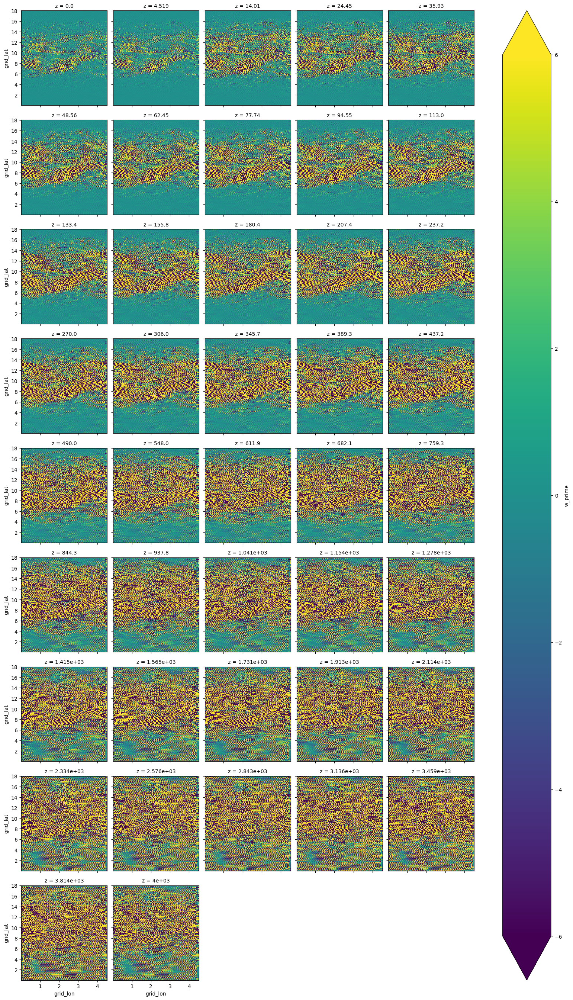

In [ ]:
# Multiply by the depth differences (spacing) to scale cumulative sum
# Assuming uniform depth spacing; adjust if `z` is irregular
z_diff = np.diff(neg_A.z)  # Compute depth spacing
z_diff = np.insert(z_diff, 0, z_diff[0])  # Extend to match 'z' dimension
w_prime *= z_diff  # Scale the cumulative sum by depth differences

# Assign a name to the result
w_prime.name = "w_prime"

# Plot the result
w_prime.plot(x="grid_lon", y="grid_lat", col="z", col_wrap=5,vmin=-6,vmax=6)

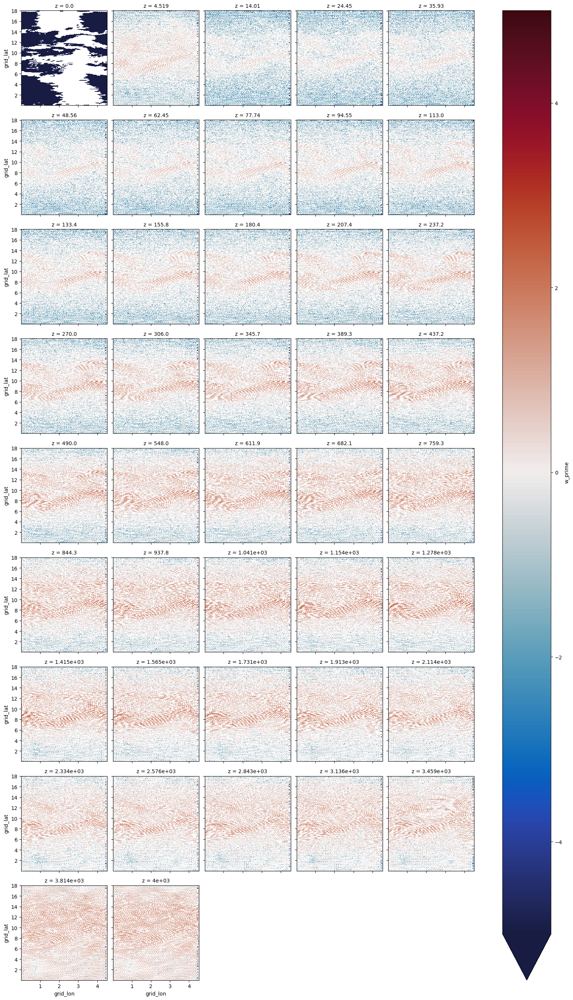

In [78]:
# S = w_prime - 
S = np.log10(w_prime.roll(z=0, roll_coords=False) - w_prime.roll(z=-1, roll_coords=False))
# S.plot(x="grid_lon", y="grid_lat", col="z", col_wrap=5,vmin=-10,vmax=10, cmap=cm.cm.balance)
S.plot(x="grid_lon", y="grid_lat", col="z", col_wrap=5, cmap=cm.cm.balance, vmin=-5,vmax=5)

#### Thrid try

In [41]:
# Compute -A (negative divergence)
neg_A = -div

# Multiply by the depth differences (spacing) to scale cumulative sum
# Assuming uniform depth spacing; adjust if `z` is irregular
z_diff = np.diff(neg_A.z)  # Compute depth spacing
z_diff2 = np.insert(z_diff, 0, z_diff[0])  # Extend to match 'z' dimension

In [46]:
neg_A.shape

(1, 42, 583, 143)

In [ ]:
# Perform layer-wise integration
w_prime2 = neg_A * z_diff  # Scale -A by depth spacing

ValueError: operands could not be broadcast together with shapes (1,42,583,143) (42,) 

In [ ]:
# Assign a name to the result
w_prime2.name = "w_prime"

# Plot the result
w_prime2.plot(x="grid_lon", y="grid_lat", col="z", col_wrap=5,vmin=-6,vmax=6)

ValueError: operands could not be broadcast together with shapes (1,42,583,143) (42,) 